In [2]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, classification_report
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression
import shap
from lime.lime_tabular import LimeTabularExplainer


In [3]:
data = pd.read_csv("compas-scores-two-years.csv")

# Preview the dataset
data.head()

,id,name,first,last,compas_screening_date,sex,dob,age,age_cat,race,...,v_decile_score,v_score_text,v_screening_date,in_custody,out_custody,priors_count.1,start,end,event,two_year_recid
0,1,miguel hernandez,miguel,hernandez,2013-08-14,Male,1947-04-18,69,Greater than 45,Other,...,1,Low,2013-08-14,2014-07-07,2014-07-14,0,0,327,0,0
1,3,kevon dixon,kevon,dixon,2013-01-27,Male,1982-01-22,34,25 - 45,African-American,...,1,Low,2013-01-27,2013-01-26,2013-02-05,0,9,159,1,1
2,4,ed philo,ed,philo,2013-04-14,Male,1991-05-14,24,Less than 25,African-American,...,3,Low,2013-04-14,2013-06-16,2013-06-16,4,0,63,0,1
3,5,marcu brown,marcu,brown,2013-01-13,Male,1993-01-21,23,Less than 25,African-American,...,6,Medium,2013-01-13,NaN,NaN,1,0,1174,0,0
4,6,bouthy pierrelouis,bouthy,pierrelouis,2013-03-26,Male,1973-01-22,43,25 - 45,Other,...,1,Low,2013-03-26,NaN,NaN,2,0,1102,0,0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7214 entries, 0 to 7213
Data columns (total 53 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       7214 non-null   int64  
 1   name                     7214 non-null   object 
 2   first                    7214 non-null   object 
 3   last                     7214 non-null   object 
 4   compas_screening_date    7214 non-null   object 
 5   sex                      7214 non-null   object 
 6   dob                      7214 non-null   object 
 7   age                      7214 non-null   int64  
 8   age_cat                  7214 non-null   object 
 9   race                     7214 non-null   object 
 10  juv_fel_count            7214 non-null   int64  
 11  decile_score             7214 non-null   int64  
 12  juv_misd_count           7214 non-null   int64  
 13  juv_other_count          7214 non-null   int64  
 14  priors_count            

<Axes: >

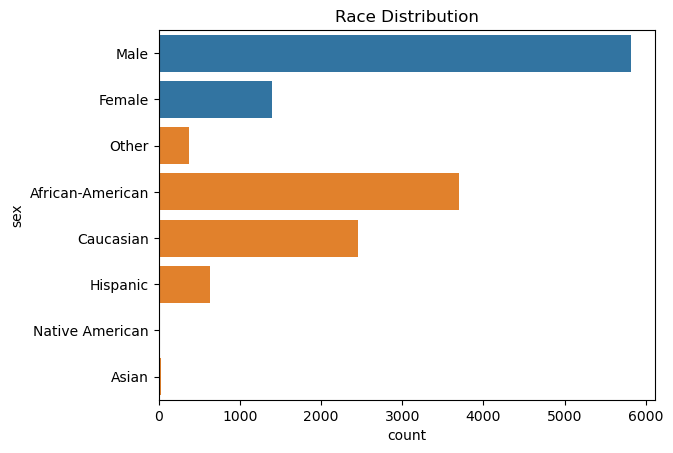

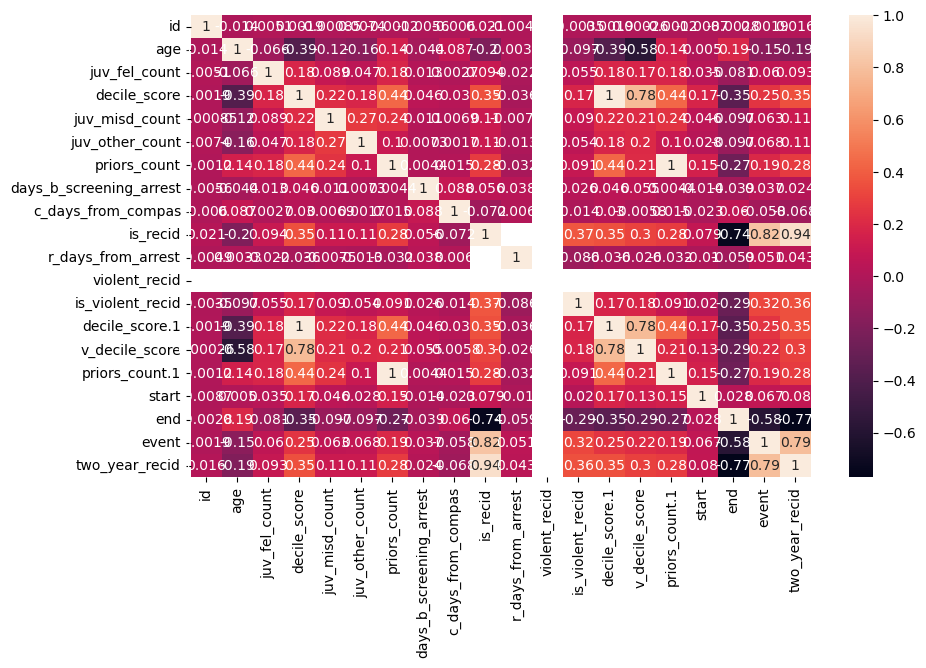

In [4]:
# Basic information about the dataset
data.info()

# Check for missing values
data.isnull().sum()

# Distribution of key features
sns.countplot(data['sex'])
plt.title('Gender Distribution')

sns.countplot(data['race'])
plt.title('Race Distribution')
numeric_data = data.select_dtypes(include=[np.number])
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_data.corr(), annot=True)

In [5]:
features = ['age', 'sex', 'race', 'priors_count', 'c_charge_degree','decile_score']
target = 'two_year_recid'

# Encoding categorical features
X = data[features]
y = data[target]

# Split the dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_test.head())

# Define the preprocessing steps
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['age', 'priors_count','decile_score']),
        ('cat', OneHotEncoder(), ['sex', 'race', 'c_charge_degree'])
    ])

# Preprocess the dataset
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

      age     sex              race  priors_count c_charge_degree  \
308    62    Male         Caucasian             0               F   
381    28    Male  African-American             1               M   
3238   57    Male  African-American             8               M   
2312   19    Male  African-American             1               F   
251    37  Female             Other             0               M   

      decile_score  
308              1  
381              3  
3238             4  
2312            10  
251              1  


In [6]:
# Model Development using XGBoost
model = XGBClassifier(random_state=42)
model.fit(X_train, y_train)

# Predictions
y_pred = model.predict(X_test)
y_proba = model.predict_proba(X_test)[:, 1]

print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.78      0.74      1207
           1       0.68      0.60      0.64       958

    accuracy                           0.70      2165
   macro avg       0.69      0.69      0.69      2165
weighted avg       0.70      0.70      0.70      2165



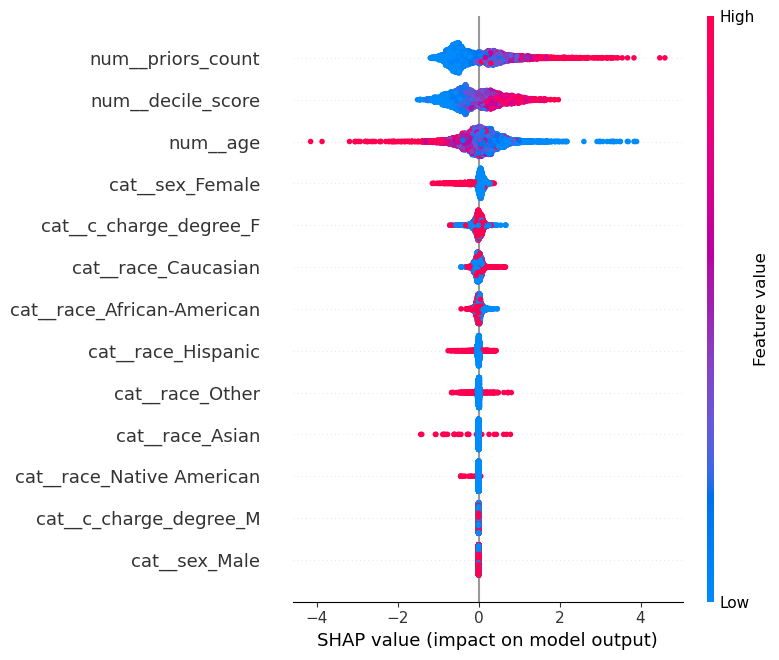

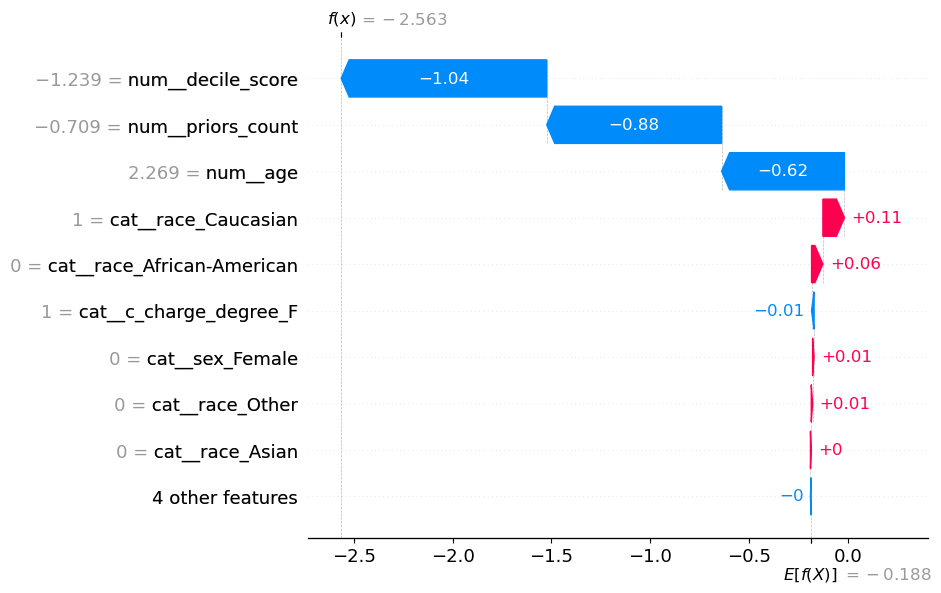

In [7]:
# Explainability with SHAP
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

# Summary plot
shap.summary_plot(shap_values, X_train, feature_names=preprocessor.get_feature_names_out())

# Select the instance and ensure it's a 2D array
instance_idx = 0
instance = X_test[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

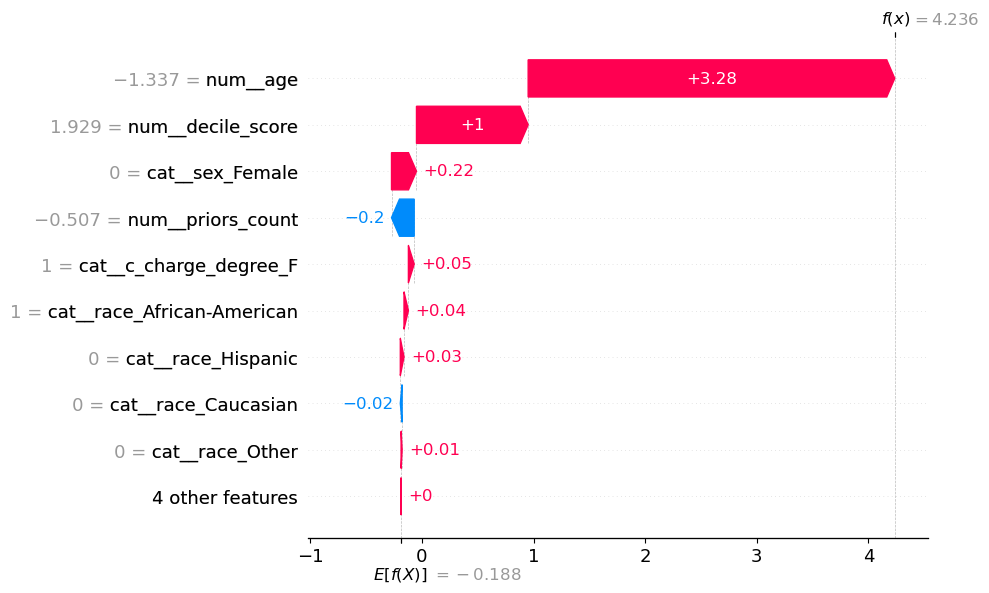

In [8]:
# Select the instance and ensure it's a 2D array
instance_idx = 3
instance = X_test[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

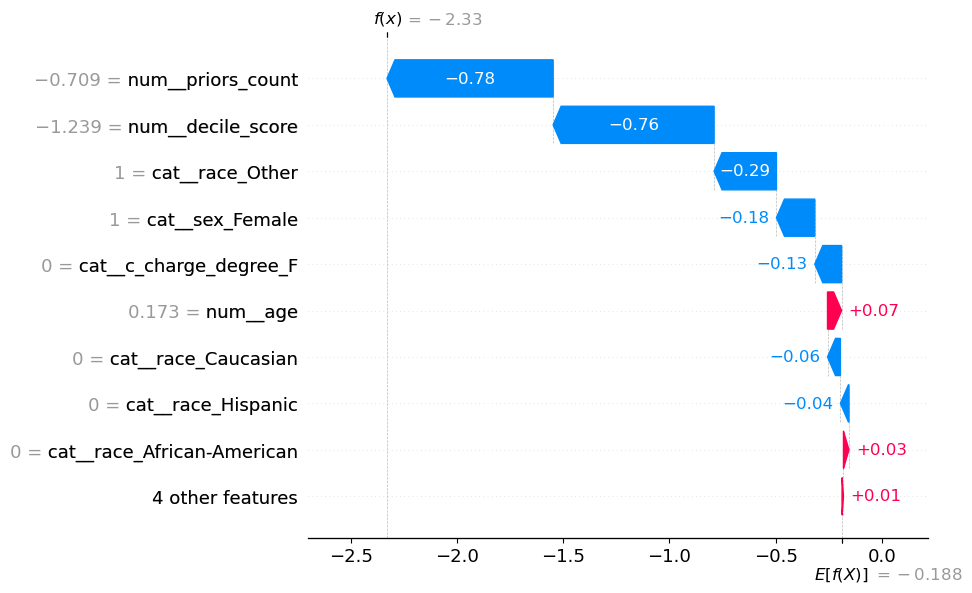

In [9]:
# Select the instance and ensure it's a 2D array
instance_idx = 4
instance = X_test[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

In [10]:
# Local Explainability using LIME
explainer = LimeTabularExplainer(X_train, feature_names=preprocessor.get_feature_names_out(), class_names=['No Recidivism', 'Recidivism'], discretize_continuous=True)
exp = explainer.explain_instance(X_test[0], model.predict_proba)
exp.show_in_notebook()

In [11]:
exp = explainer.explain_instance(X_test[3], model.predict_proba)
exp.show_in_notebook()

In [12]:
exp = explainer.explain_instance(X_test[4], model.predict_proba)
exp.show_in_notebook()

In [13]:
# Fairness Analysis - Demographic Parity
def demographic_parity(y_pred, sensitive_attribute):
    return pd.crosstab(y_pred, sensitive_attribute, normalize='columns')

# Calculate fairness across gender
print("Demographic Parity across Gender:")
print(demographic_parity(y_pred, X['sex'].iloc[y_test.index]))

# Calculate fairness across race
print("Demographic Parity across Race:")
print(demographic_parity(y_pred, X['race'].iloc[y_test.index]))

Demographic Parity across Gender:
sex      Female      Male
row_0                    
0      0.735516  0.580882
1      0.264484  0.419118
Demographic Parity across Race:
race   African-American     Asian  Caucasian  Hispanic  Native American  \
row_0                                                                     
0              0.513489  0.666667   0.693243  0.754098         0.333333   
1              0.486511  0.333333   0.306757  0.245902         0.666667   

race      Other  
row_0            
0      0.760331  
1      0.239669  


In [14]:
def equal_opportunity_difference(y_true, y_pred, sensitive_attribute, positive_class=1):
    cm = pd.crosstab(y_true, [y_pred, sensitive_attribute], normalize='columns')
    return cm.loc[positive_class]

# Example usage for race:
eod_race = equal_opportunity_difference(y_test, y_pred, X['race'].iloc[y_test.index])
print("Equal Opportunity Difference across Race:\n", eod_race)

Equal Opportunity Difference across Race:
 col_0  race            
0      African-American    0.327496
       Asian               0.000000
       Caucasian           0.257310
       Hispanic            0.268116
       Native American     0.000000
       Other               0.293478
1      African-American    0.726433
       Asian               0.500000
       Caucasian           0.634361
       Hispanic            0.466667
       Native American     0.500000
       Other               0.517241
Name: 1, dtype: float64


In [15]:
from sklearn.utils.class_weight import compute_sample_weight


features = ['age', 'sex', 'race', 'priors_count', 'c_charge_degree','decile_score']
target = 'two_year_recid'

# Split the dataset
X = data[features]
y = data[target]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print(X_test.head())
# Compute sample weights based on the 'race' feature (you can change to 'sex' or other features)
X_train['sample_weights'] = compute_sample_weight(
    'balanced', y_train * 100 + X_train['race'].factorize()[0]
)

# Apply column transformation (scaling numeric features and one-hot encoding categorical features)
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['age', 'priors_count','decile_score']),
        ('cat', OneHotEncoder(sparse_output=False), ['sex', 'race', 'c_charge_degree'])  # Correct argument name
    ])


# Preprocess the data (fit and transform for training, only transform for test)
X_train_processed = preprocessor.fit_transform(X_train)
X_test_processed = preprocessor.transform(X_test)



# Ensure sample weights are passed correctly to the model
# Fit your model with sample weights
model = XGBClassifier()  # Example model
model.fit(X_train_processed, y_train, sample_weight=X_train['sample_weights'])

# Now you can evaluate your model
y_pred = model.predict(X_test_processed)

      age     sex              race  priors_count c_charge_degree  \
308    62    Male         Caucasian             0               F   
381    28    Male  African-American             1               M   
3238   57    Male  African-American             8               M   
2312   19    Male  African-American             1               F   
251    37  Female             Other             0               M   

      decile_score  
308              1  
381              3  
3238             4  
2312            10  
251              1  


In [16]:
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.71      0.71      1207
           1       0.63      0.64      0.64       958

    accuracy                           0.68      2165
   macro avg       0.67      0.67      0.67      2165
weighted avg       0.68      0.68      0.68      2165



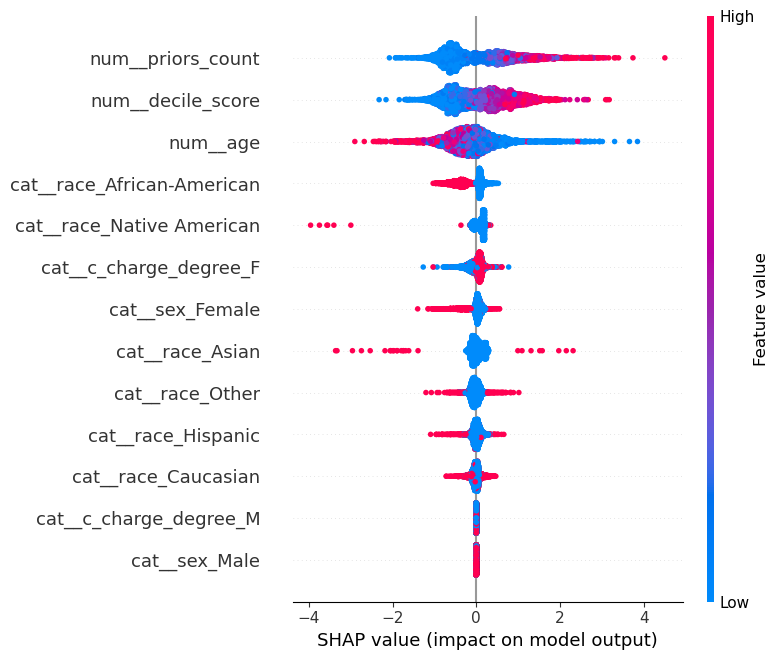

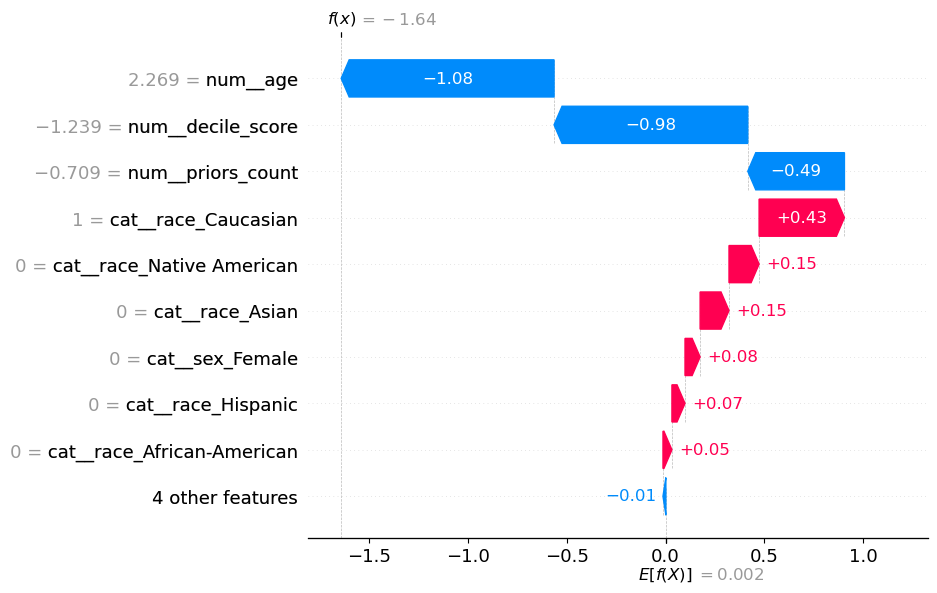

In [17]:
# Explainability with SHAP
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_processed)

# Summary plot
shap.summary_plot(shap_values, X_train_processed, feature_names=preprocessor.get_feature_names_out())



# Select the instance and ensure it's a 2D array
instance_idx = 0
instance = X_test_processed[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

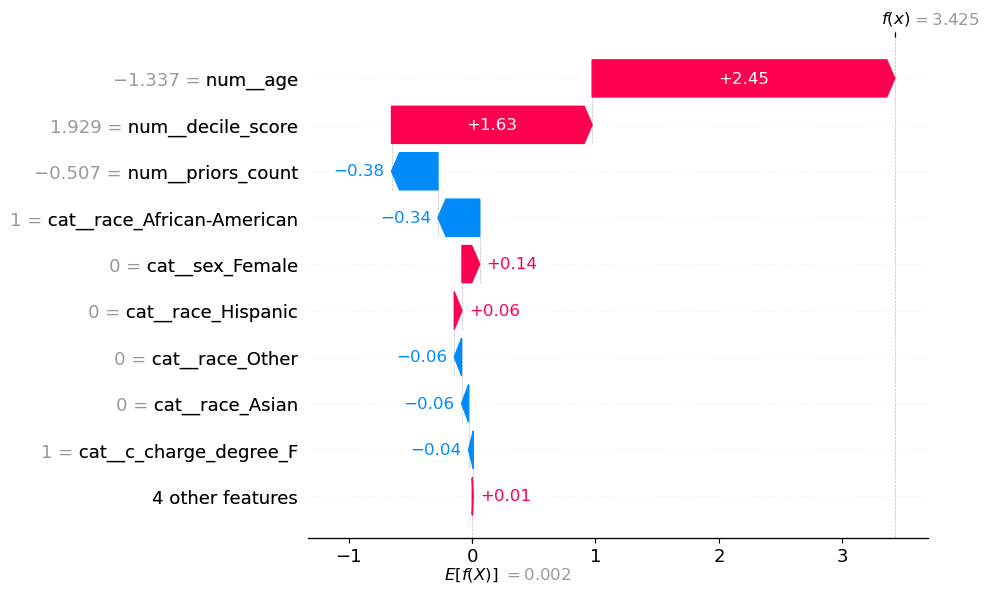

In [18]:
instance_idx = 3
instance = X_test_processed[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

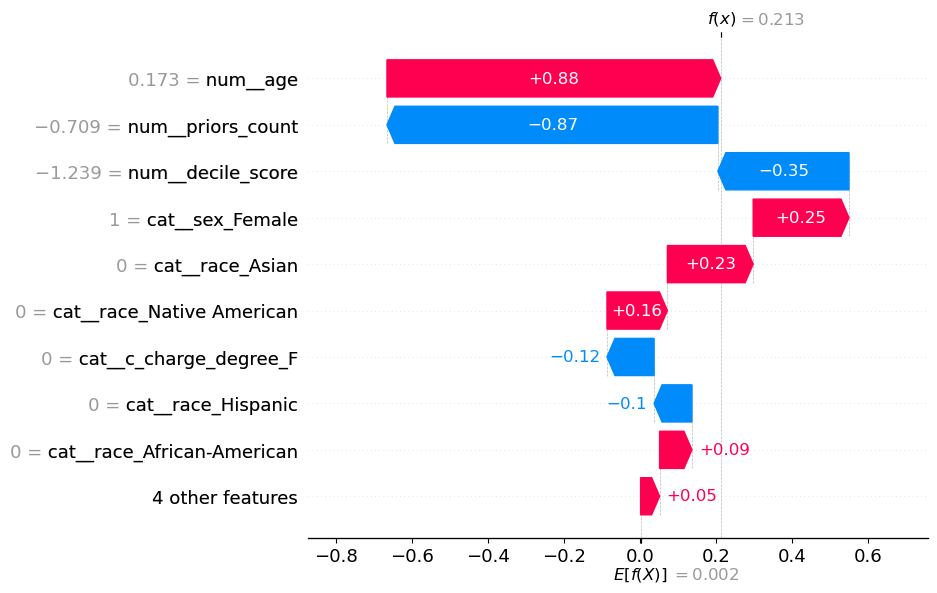

In [19]:
instance_idx = 4
instance = X_test_processed[instance_idx, :].reshape(1, -1)  # Reshape to a 2D array with 1 sample

# Generate SHAP values for the single instance (2D array)
instance_shap_values = explainer.shap_values(instance)

# Create the waterfall plot
shap.waterfall_plot(
    shap.Explanation(
        values=instance_shap_values[0],  # Access the first instance's SHAP values
        base_values=explainer.expected_value,
        data=instance[0],  # The input data for the instance
        feature_names=preprocessor.get_feature_names_out()
    )
)

In [20]:
explainer = LimeTabularExplainer(X_train_processed, feature_names=preprocessor.get_feature_names_out(), class_names=['No Recidivism', 'Recidivism'], discretize_continuous=True)
exp = explainer.explain_instance(X_test_processed[0], model.predict_proba)
exp.show_in_notebook()

In [21]:
exp = explainer.explain_instance(X_test_processed[3], model.predict_proba)
exp.show_in_notebook()

In [22]:
exp = explainer.explain_instance(X_test_processed[4], model.predict_proba)
exp.show_in_notebook()

In [23]:
# Fairness Analysis - Demographic Parity
def demographic_parity(y_pred, sensitive_attribute):
    return pd.crosstab(y_pred, sensitive_attribute, normalize='columns')

# Calculate fairness across gender
print("Demographic Parity across Gender:")
print(demographic_parity(y_pred, X['sex'].iloc[y_test.index]))

# Calculate fairness across race
print("Demographic Parity across Race:")
print(demographic_parity(y_pred, X['race'].iloc[y_test.index]))

Demographic Parity across Gender:
sex      Female      Male
row_0                    
0      0.695214  0.519231
1      0.304786  0.480769
Demographic Parity across Race:
race   African-American     Asian  Caucasian  Hispanic  Native American  \
row_0                                                                     
0              0.510791  0.666667    0.57973  0.677596         0.333333   
1              0.489209  0.333333    0.42027  0.322404         0.666667   

race      Other  
row_0            
0      0.561983  
1      0.438017  


In [24]:
def equal_opportunity_difference(y_true, y_pred, sensitive_attribute, positive_class=1):
    cm = pd.crosstab(y_true, [y_pred, sensitive_attribute], normalize='columns')
    return cm.loc[positive_class]

# Example usage for race:
eod_race = equal_opportunity_difference(y_test, y_pred, X['race'].iloc[y_test.index])
print("Equal Opportunity Difference across Race:\n", eod_race)

Equal Opportunity Difference across Race:
 col_0  race            
0      African-American    0.323944
       Asian               0.000000
       Caucasian           0.247086
       Hispanic            0.274194
       Native American     0.000000
       Other               0.279412
1      African-American    0.727941
       Asian               0.500000
       Caucasian           0.546624
       Hispanic            0.406780
       Native American     0.500000
       Other               0.433962
Name: 1, dtype: float64


In [27]:
from fairlearn.metrics import MetricFrame, true_positive_rate, false_positive_rate

In [36]:
from aif360.algorithms.preprocessing import DisparateImpactRemover
from aif360.datasets import BinaryLabelDataset
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import LabelEncoder



# Define features and target
features = ['age', 'sex', 'race', 'priors_count', 'c_charge_degree', 'decile_score']
target = 'two_year_recid'

# Encode categorical features in the dataset
label_encoders = {}
for col in ['sex', 'race', 'c_charge_degree']:
    label_encoders[col] = LabelEncoder()
    data[col] = label_encoders[col].fit_transform(data[col])

# Split the dataset
X = data[features]
y = data[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Combine X_train and y_train for BinaryLabelDataset
train_data = X_train.copy()
train_data[target] = y_train

train_bld = BinaryLabelDataset(
    favorable_label=1,
    unfavorable_label=0,
    df=train_data,
    label_names=[target],
    protected_attribute_names=['race']
)

# Apply Disparate Impact Remover
dir_remover = DisparateImpactRemover(sensitive_attribute='race', repair_level=0.8)
train_bld_repaired = dir_remover.fit_transform(train_bld)

# Convert repaired dataset back to Pandas DataFrame
X_train_repaired = pd.DataFrame(
    train_bld_repaired.features,
    columns=features
)
y_train_repaired = train_bld_repaired.labels.ravel()

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['age', 'priors_count', 'decile_score']),
        ('cat', OneHotEncoder(sparse_output=False), ['sex', 'race', 'c_charge_degree'])
    ]
)

# Preprocess the data
X_train_repaired_processed = preprocessor.fit_transform(X_train_repaired)
X_test_processed = preprocessor.transform(X_test)  # Transform test set directly

# Train the model
model = XGBClassifier()
model.fit(X_train_repaired_processed, y_train_repaired)

# Evaluate model predictions
y_pred_repaired = model.predict(X_test_processed)

# Output predictions (example output)
print("Predictions on test set:", y_pred_repaired)


Predictions on test set: [0 1 1 ... 0 1 0]


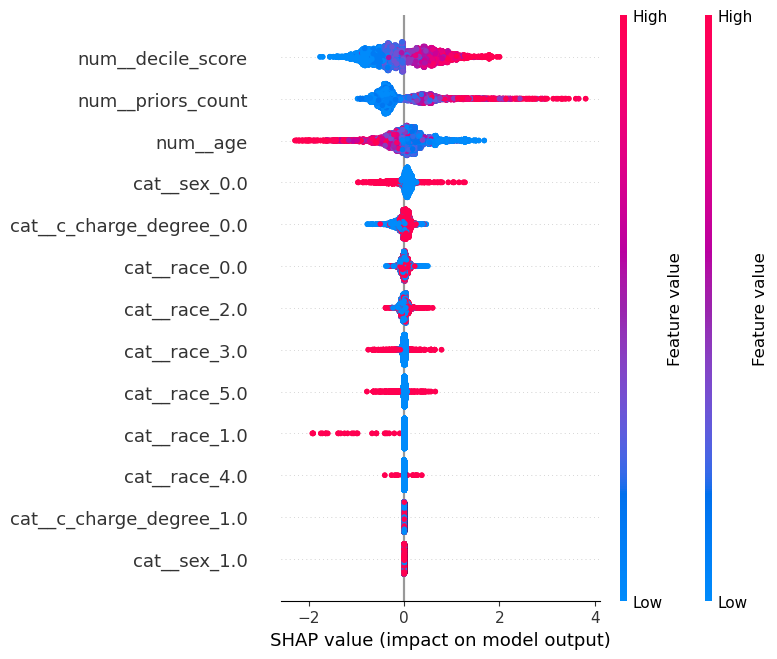

In [39]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train_repaired_processed)
%matplotlib inline
# Summary plot
shap.summary_plot(shap_values, X_train_processed, feature_names=preprocessor.get_feature_names_out())



In [42]:
print("Classification Report:\n", classification_report(y_test, y_pred_repaired))

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.59      0.65      1207
           1       0.58      0.73      0.65       958

    accuracy                           0.65      2165
   macro avg       0.66      0.66      0.65      2165
weighted avg       0.67      0.65      0.65      2165



In [41]:
def demographic_parity(y_pred_repaired, sensitive_attribute):
    return pd.crosstab(y_pred_repaired, sensitive_attribute, normalize='columns')

# Calculate fairness across gender
print("Demographic Parity across Gender:")
print(demographic_parity(y_pred_repaired, X_test['sex']))

# Calculate fairness across race
print("Demographic Parity across Race:")
print(demographic_parity(y_pred_repaired, X_test['race']))

Demographic Parity across Gender:
sex           0         1
row_0                    
0      0.566751  0.419683
1      0.433249  0.580317
Demographic Parity across Race:
race          0         1         2         3         4         5
row_0                                                            
0      0.341727  0.666667  0.551351  0.480874  0.333333  0.710744
1      0.658273  0.333333  0.448649  0.519126  0.666667  0.289256


In [ ]:
def equal_opportunity_difference(y_true, y_pred, sensitive_attribute, positive_class=1):
    cm = pd.crosstab(y_true, [y_pred, sensitive_attribute], normalize='columns')
    return cm.loc[positive_class]

# Example usage for race:
eod_race = equal_opportunity_difference(y_test, y_pred_repaired, X['race'].iloc[y_test.index])
print("Equal Opportunity Difference across Race:\n", eod_race)